In [1]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nibabel as nib
import statsmodels.formula.api as smf
from scipy import stats

plt.style.use('seaborn-v0_8-poster')


In [2]:
def significance_marker(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return ""


def _draw_sig_line(ax, x1, x2, y, text, h=0.03):
    """Draw a flipped (downward) significance bracket below bars."""
    ax.plot((x1, x1, x2, x2),
            (y, y - h, y - h, y),
            lw=1.5, color="black", clip_on=False)
    if text:
        ax.text((x1 + x2) / 2.0, y - h * 1.2, text,
                ha="center", va="top",
                fontsize=14, fontweight="bold", color="black")


def get_matching_model_terms(model, variable):
    """
    Return model term names from model.params.index that match `variable`,
    excluding Group–Gender interactions.

    Behavior:
    ----------
    - If `variable` has no ':' or '*' → return only main-effect terms
      (e.g., 'Group' → ['Group[T.HC]'])
    - If `variable` includes ':' or '*' → return exact interaction terms
      (e.g., 'Group:Drug' → ['Group[T.HC]:Drug[T.Placebo]'])
    - If `variable` == 'two_way' → return *all* 2-way interactions
      (useful in 3-factor models like Group * Drug * Gender)
    - If `variable` == 'three_way' → return *all* 3-way interactions
    - Excludes Group–Gender interactions from all results.
    """

    # Remove intercept
    params = [p for p in model.params.index if p.lower() != "intercept"]

    # Helper: Exclude any Group–Gender interaction
    def is_group_gender_interaction(term):
        term_lower = term.lower()
        return "group" in term_lower and "gender" in term_lower

    # === Case 1: Request all 2-way interactions ===
    if variable.lower() == "two_way":
        return [p for p in params if p.count(":") == 1 and not is_group_gender_interaction(p)]

    # === Case 2: Request all 3-way interactions ===
    if variable.lower() == "three_way":
        return [p for p in params if p.count(":") == 2 and not is_group_gender_interaction(p)]

    # === Case 3: Single factor → main effects only ===
    if (":" not in variable) and ("*" not in variable):
        factor = variable
        return [p for p in params if p.startswith(factor + "[") and (":" not in p)]

    # === Case 4: Specific interaction (2-way or 3-way) ===
    var = variable.replace("*", ":")
    factors = [f for f in var.split(":") if f]

    out = []
    for p in params:
        # must have correct interaction order
        if p.count(":") != (len(factors) - 1):
            continue
        # must include all specified factors
        if all((f + "[") in p for f in factors):
            # exclude Group–Gender interactions
            if not is_group_gender_interaction(p):
                out.append(p)

    return out



def extract_factors_from_term(term):
    """
    Extract base factor names (e.g., 'Group', 'Drug', 'Gender') 
    from a statsmodels term like:
        'Group[T.HC]:Drug[T.Placebo]'  → ['Group', 'Drug']
        'Group[T.HC]:Drug[T.Placebo]:Gender[T.Female]' → ['Group', 'Drug', 'Gender']
        'Group[T.HC]' → ['Group']

    Works for both main and interaction terms.
    """
    # Split by ':' to separate interaction components
    parts = term.split(":")
    # For each part, take everything before the first '['
    factors = [p.split("[")[0] for p in parts]
    return factors

In [3]:
def add_sig_stars(ax, df, roi_list, variable, pad_frac=0.1, hue_order=None):
    """
    Generalized version that supports 2-way, 3-way, or higher-order interactions.

    Prints:
      1. Model result (ROI, variable, β, t, df, p)
      2. One-sample t-tests (ROI, factor level, mean, t, df, p)
    Adds * to bar plot for significant results.

    Automatically reads model factors from 'variable'.
    e.g. variable='Group[T.HC]:Drug[T.Placebo]:Gender[T.Female]' → model='Z_score ~ Group * Drug * Gender'
    """

    ymin, ymax = ax.get_ylim()
    y_range = ymax - ymin
    is_interaction = ":" in variable

    # === Parse model factors dynamically ===
    # Example: 'Group[T.HC]:Drug[T.Placebo]:Gender[T.Female]' → ['Group', 'Drug', 'Gender']
    factors = list(dict.fromkeys([term.split("[")[0] for term in variable.split(":")]))
    formula = "Z_score ~ " + " * ".join(factors) + ("" if "guess" in factors else " + guess")


    print(f"\nModel results ({formula})")
    print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
    print("-" * 100)

    # === Table 1: Model results ===
    for i, roi in enumerate(roi_list):
        df_roi = df[df["ROI"] == roi]
        if len(df_roi) < 4:
            continue

        # 🔹 Dynamically specified model
        model = smf.ols(formula, data=df_roi).fit()

        if variable not in model.params.index:
            continue

        beta = model.params[variable]
        tval = model.tvalues[variable]
        pval = model.pvalues[variable]
        dfree = int(model.df_resid)
        star = significance_marker(pval)

        print(f"{roi:<15} {variable:<50} {beta:>10.3f} {tval:>8.2f} {dfree:>5} {pval:>8.3f} {star:>5}")

        # --- Bar selection per ROI ---
        bars = [r for r in ax.patches if abs((r.get_x() + r.get_width() / 2) - i) < 0.45]
        if not bars:
            continue

        # --- Draw flipped bracket for significant model effects (main effects only) ---
        if not is_interaction and star:
            bars_sorted = sorted(bars, key=lambda r: r.get_x())
            b1, b2 = bars_sorted[0], bars_sorted[-1]
            x1c = b1.get_x() + b1.get_width() / 2
            x2c = b2.get_x() + b2.get_width() / 2
            x_mid = (x1c + x2c) / 2
            y1 = b1.get_y() + b1.get_height()
            y2 = b2.get_y() + b2.get_height()
            min_y = min(y1, y2)
            y_bracket = min_y - 0.3
            y_star = min_y - 0.4
            _draw_sig_line(ax, x1c, x2c, y_bracket, "", h=y_range * 0.03)
            ax.text(x_mid, y_star, star,
                    ha="center", va="top",
                    fontsize=14, fontweight="bold", color="black")

    print("-" * 100)

    # === Table 2: One-sample t-tests ===
    if is_interaction:
        group_factors = factors
        print(f"ONE-SAMPLE T-TESTS BY INTERACTION LEVEL ({' × '.join(group_factors)})")
    else:
        group_factors = [factors[0]]
        print(f"ONE-SAMPLE T-TESTS BY {group_factors[0].upper()} LEVEL")

    print(f"{'ROI':<15} {'Level':<50} {'Mean':>10} {'t':>8} {'df':>6} {'p':>10} {'Sig':>5}")
    print("-" * 100)

    for i, roi in enumerate(roi_list):
        df_roi = df[df["ROI"] == roi]
        if len(df_roi) < 4:
            continue

        bars = [r for r in ax.patches if abs((r.get_x() + r.get_width() / 2) - i) < 0.45]

        # === Main effect ===
        if len(group_factors) == 1:
            factor = group_factors[0]
            if factor not in df_roi.columns:
                continue

            for level, vals in df_roi.groupby(factor, observed=False):
                if len(vals) < 3:
                    continue
                tstat, pval = stats.ttest_1samp(vals["Z_score"], 0)
                dfree = len(vals) - 1
                mean_val = np.mean(vals["Z_score"])
                star = significance_marker(pval)
                label = f"{factor}={level}"
                print(f"{roi:<15} {label:<50} {mean_val:>10.3f} {tstat:>8.2f} {dfree:>6} {pval:>10.3f} {star:>5}")

                if star:
                    if hue_order is None:
                        hue_order = list(df[factor].cat.categories)
                    level_to_bar = dict(zip(hue_order, bars))
                    if level in level_to_bar:
                        rect = level_to_bar[level]
                        cx = rect.get_x() + rect.get_width() / 2
                        top = rect.get_y() + rect.get_height()
                        y_star = 0.04 if mean_val <= 0 else top + y_range * pad_frac + 0.2
                        ax.text(cx, y_star, star,
                                ha="center", va="bottom",
                                fontsize=14, fontweight="bold", color="black")

        # === Interaction effect (2-way, 3-way, or higher) ===
        else:
            valid_factors = [f for f in group_factors if f in df_roi.columns]
            if len(valid_factors) < 2:
                continue

            for levels, vals in df_roi.groupby(valid_factors, observed=False):
                if len(vals) < 3:
                    continue
                tstat, pval = stats.ttest_1samp(vals["Z_score"], 0)
                dfree = len(vals) - 1
                mean_val = np.mean(vals["Z_score"])
                star = significance_marker(pval)
                level_labels = "_".join(map(str, levels))
                print(f"{roi:<15} {level_labels:<50} {mean_val:>10.3f} "
                      f"{tstat:>8.2f} {dfree:>6} {pval:>10.3f} {star:>5}")

                if star:
                    # Build hue order dynamically based on unique combinations
                    if hue_order is None:
                        hue_order = [
                            "_".join(map(str, combo))
                            for combo in df_roi[valid_factors]
                            .drop_duplicates()
                            .itertuples(index=False, name=None)
                        ]
                    level_to_bar = dict(zip(hue_order, bars))
                    key = "_".join(map(str, levels))
                    if key in level_to_bar:
                        rect = level_to_bar[key]
                        cx = rect.get_x() + rect.get_width() / 2
                        top = rect.get_y() + rect.get_height()
                        y_star = 0.04 if mean_val <= 0 else top + y_range * pad_frac + 0.2
                        ax.text(cx, y_star, star,
                                ha="center", va="bottom",
                                fontsize=14, fontweight="bold", color="black")

    print("-" * 100)


In [4]:
def add_sig_stars_lineplot_interaction(ax, df, roi_list, variable):
    """
    Adds significance stars (***, **, *) to each subplot's title
    if the specified interaction term in `variable` is significant
    for that ROI.

    Automatically supports 2-way, 3-way, or higher-order interactions.
    e.g.:
        'Group[T.HC]:Gender[T.Female]'
        'Group[T.HC]:Drug[T.Placebo]:Gender[T.Female]'
    """

    # Extract main factors from variable (remove duplicates safely)
    factors = list(dict.fromkeys([term.split("[")[0] for term in variable.split(":")]))
    formula = "Z_score ~ " + " * ".join(factors) + ("" if "guess" in factors else " + guess")


    axes = ax.flat if hasattr(ax, "flat") else [ax]

    print(f"\n=== Lineplot significance check for {variable} ===")
    print(f"Model formula: {formula}")
    print(f"{'ROI':<15} {'p-value':>10} {'Sig':>5}")
    print("-" * 35)

    for i, roi in enumerate(roi_list):
        if i >= len(axes):
            break
        ax_i = axes[i]

        df_roi = df[df["ROI"] == roi]
        if len(df_roi) < 4:
            continue

        # Dynamically fit model with all relevant factors
        model = smf.ols(formula, data=df_roi).fit()

        # Skip if the term is not part of the model
        if variable not in model.pvalues.index:
            continue

        # Get p-value and significance marker
        pval = model.pvalues[variable]
        star = significance_marker(pval)

        # Update subplot title with star if significant
        current_title = ax_i.get_title()
        new_title = f"{current_title} {star}" if star else current_title
        ax_i.set_title(new_title, fontweight="bold" if star else "normal")

        print(f"{roi:<15} {pval:>10.4f} {star:>5}")

    print("-" * 35)


In [5]:
tasks = ['phase2','phase3']
contrast_list = [
        "CSR-CSS",   
        "CSR-CS-",
        "CSS-CS-",
        "CSR-fix", 
        "CSS-fix",   
        "CSminus-fix"
        ]
ROI_list = [
        'Amygdala', 'Insula', 'Hippocampus', 'ACC', 
        'VMPFC'
        ]
group_list = [
        'Patient',
        'HC'
        ]
drug_list = ['Oxytocin',
        'Placebo']
gender_list = ['Male', 'Female']
guess_list = ['no', 'yes']

In [6]:
plot_dir_top = '/Users/xiaoqianxiao/Projects/NARSAD/MRI/derivatives/fMRI_analysis/ROI/plotsmodel-guess-noGroupGenderInteraction_motion-ori'
drug_order_file = '/Users/xiaoqianxiao/Projects/NARSAD/MRI/source_data/behav/drug_order.xlsx'
df_drug_order = pd.read_excel(drug_order_file, 'drug_order')
first_level_dir = '/Users/xiaoqianxiao/Projects/NARSAD/MRI/derivatives/fMRI_analysis/ROI'
first_level_data_file = os.path.join(first_level_dir, 'first_level.csv')
df_fMRI = pd.read_csv(first_level_data_file)
df_merged = pd.merge(df_fMRI, df_drug_order, on='subID', how='left')
df_all = df_merged.rename(columns={
    'Task': 'Phase'
})
df_all.loc[df_all['subID'].str.startswith('N1'), 'Group'] = 'Patient'
df_all.loc[df_all['subID'].str.startswith('N2'), 'Group'] = 'HC'
categorical_cols = ['ROI', 'subID', 'Phase', 'Contrast', 'Group', 'Gender', 'Drug','guess']
df_all[categorical_cols] = df_all[categorical_cols].astype('category')
df_all['Contrast'] = df_all['Contrast'].cat.set_categories(contrast_list, ordered=True)
df_all['ROI'] = df_all['ROI'].cat.set_categories(ROI_list, ordered=True)
df_all['Group'] = df_all['Group'].cat.set_categories(group_list, ordered=True)
df_all['Drug'] = df_all['Drug'].cat.set_categories(drug_list, ordered=True)
df_all['Gender'] = df_all['Gender'].cat.set_categories(gender_list, ordered=True)
df_all['guess'] = df_all['guess'].map({0.0: 'no', 1.0: 'yes'})
df_all['guess'] = pd.Categorical(df_all['guess'], categories=['no', 'yes'])


In [7]:
print(len(df_fMRI.loc[df_fMRI['Task']=='phase2']['subID'].unique()))
print(len(df_fMRI.loc[df_fMRI['Task']=='phase3']['subID'].unique()))
print(len(df_drug_order['subID'].unique()))

100
101
104


In [8]:
# Subjects in drug order but missing from fMRI data
missing_in_fMRI = df_drug_order.loc[
    ~df_drug_order['subID'].isin(df_fMRI.loc[df_fMRI['Task']=='phase2']['subID']), 'subID'
].unique()

print(f"🧩 Subjects in drug order file but not in fMRI data in phase2: {len(missing_in_fMRI)}")
print(missing_in_fMRI)

missing_in_fMRI = df_drug_order.loc[
    ~df_drug_order['subID'].isin(df_fMRI.loc[df_fMRI['Task']=='phase3']['subID']), 'subID'
].unique()

print(f"🧩 Subjects in drug order file but not in fMRI data in phase3: {len(missing_in_fMRI)}")
print(missing_in_fMRI)
# SUBJECTS_NO_MRI = {
#     'phase2': ['N102', 'N208'],
#     'phase3': ['N102', 'N208', 'N120']
# }
# removing subjects w wrong sequence / missing phases:
# sub101 has 2mm seq for phase 2, 3mm (correct) for phase 3
# sub201, has 2mm seq for phase 2, 3mm (correct) for phase 3



🧩 Subjects in drug order file but not in fMRI data in phase2: 4
['N101' 'N102' 'N201' 'N208']
🧩 Subjects in drug order file but not in fMRI data in phase3: 3
['N102' 'N120' 'N208']


Extinction

Entire

In [9]:
plot_dir = os.path.join(plot_dir_top, 'extinction/entire_dataset')
os.makedirs(plot_dir, exist_ok=True)
model = smf.ols("Z_score ~ Group * Drug * Gender + guess", data=df_all).fit()


===== Group main effect: CSR-CSS =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                           -0.172    -0.71    98    0.478      
Insula          guess[T.yes]                                            0.070     0.27    98    0.788      
Hippocampus     guess[T.yes]                                           -0.010    -0.04    98    0.970      
ACC             guess[T.yes]                                            0.107     0.41    98    0.682      
VMPFC           guess[T.yes]                                           -0.112    -0.40    98    0.692      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

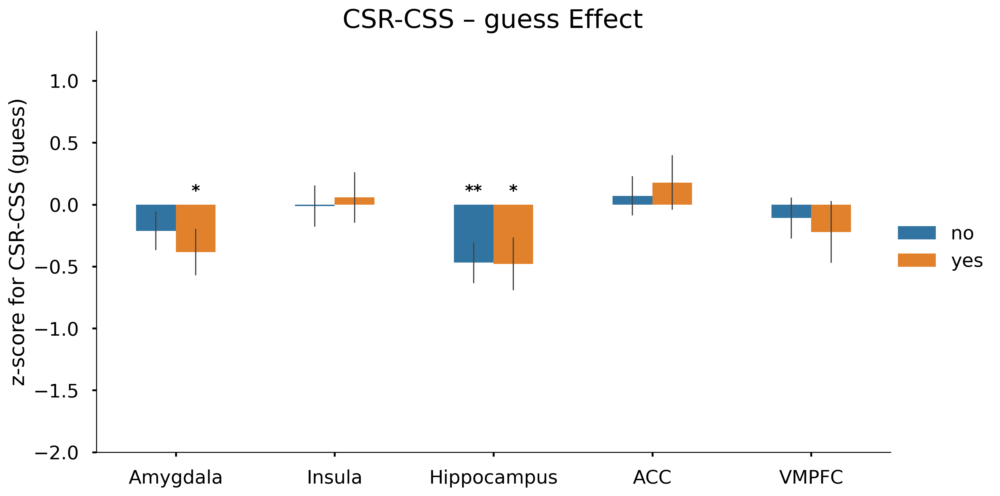


===== Group main effect: CSR-CS- =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                           -0.340    -1.42    98    0.158      
Insula          guess[T.yes]                                            0.025     0.09    98    0.932      
Hippocampus     guess[T.yes]                                           -0.210    -0.69    98    0.490      
ACC             guess[T.yes]                                            0.129     0.44    98    0.661      
VMPFC           guess[T.yes]                                           -0.007    -0.02    98    0.981      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

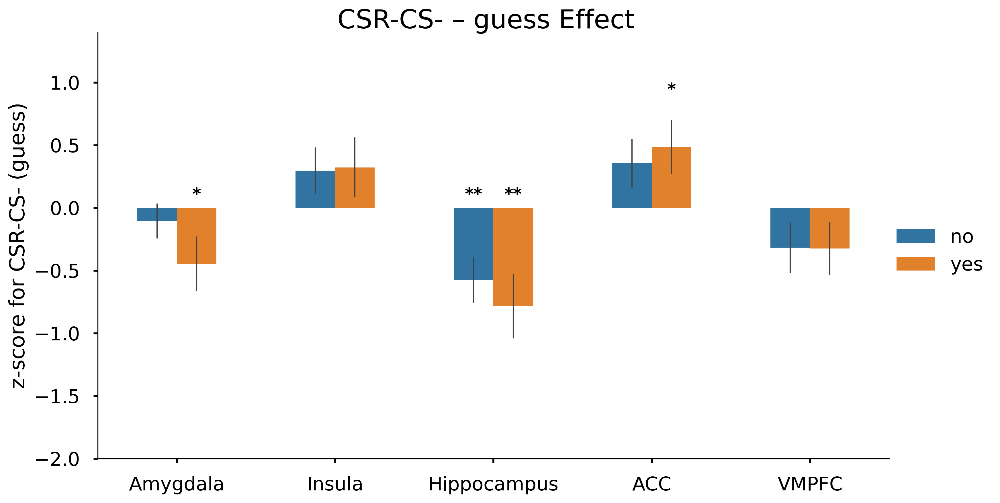


===== Group main effect: CSS-CS- =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                           -0.149    -0.66    98    0.512      
Insula          guess[T.yes]                                           -0.032    -0.11    98    0.913      
Hippocampus     guess[T.yes]                                           -0.192    -0.76    98    0.449      
ACC             guess[T.yes]                                            0.028     0.10    98    0.921      
VMPFC           guess[T.yes]                                            0.116     0.42    98    0.676      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

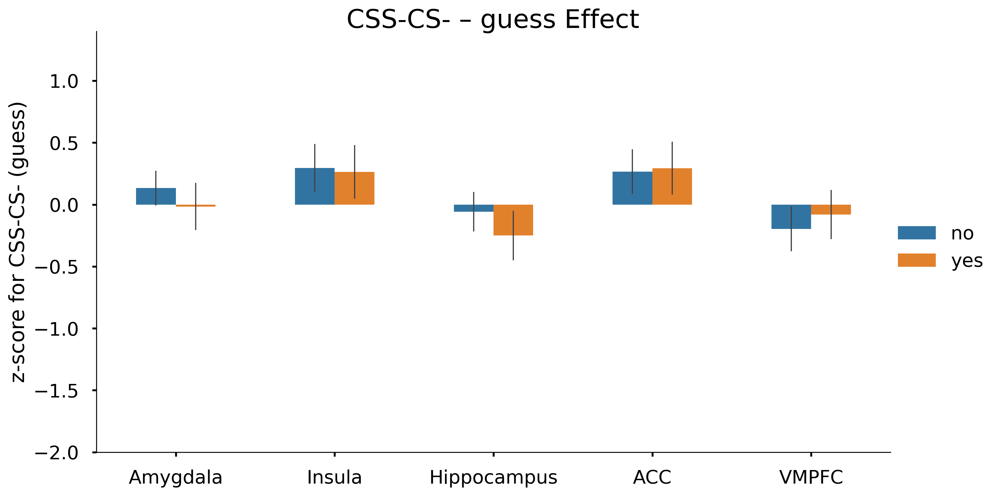


===== Group main effect: CSR-fix =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                           -0.201    -0.76    98    0.451      
Insula          guess[T.yes]                                            0.312     1.26    98    0.212      
Hippocampus     guess[T.yes]                                           -0.059    -0.19    98    0.846      
ACC             guess[T.yes]                                            0.435     1.47    98    0.144      
VMPFC           guess[T.yes]                                            0.094     0.32    98    0.752      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

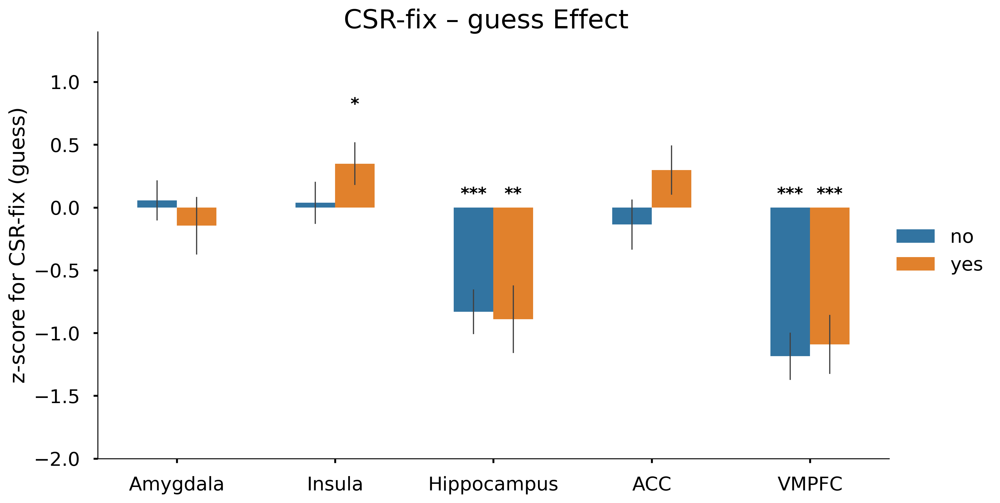


===== Group main effect: CSS-fix =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                            0.030     0.13    98    0.900      
Insula          guess[T.yes]                                            0.205     0.78    98    0.436      
Hippocampus     guess[T.yes]                                           -0.043    -0.18    98    0.860      
ACC             guess[T.yes]                                            0.275     1.03    98    0.304      
VMPFC           guess[T.yes]                                            0.253     0.86    98    0.392      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

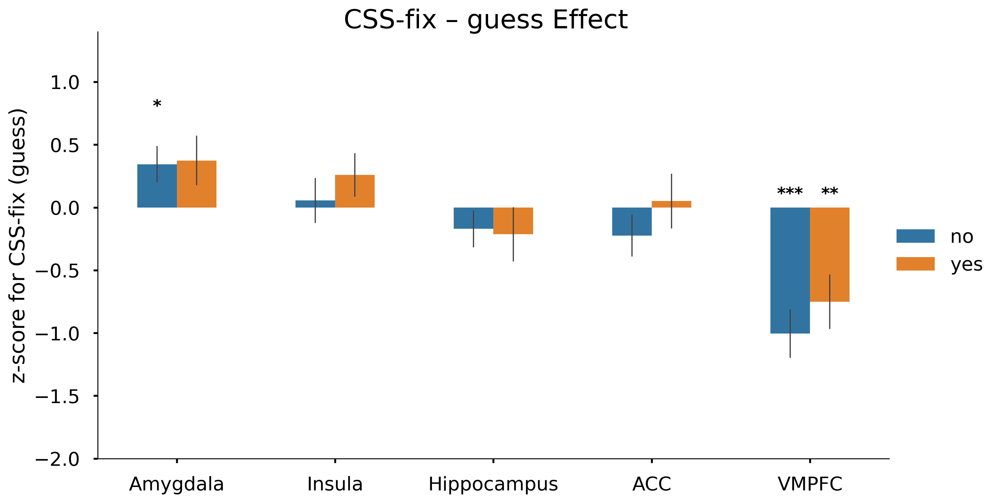


===== Group main effect: CSminus-fix =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                            0.246     1.04    98    0.299      
Insula          guess[T.yes]                                            0.293     0.98    98    0.331      
Hippocampus     guess[T.yes]                                            0.220     0.85    98    0.400      
ACC             guess[T.yes]                                            0.290     0.97    98    0.332      
VMPFC           guess[T.yes]                                            0.119     0.41    98    0.680      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                  

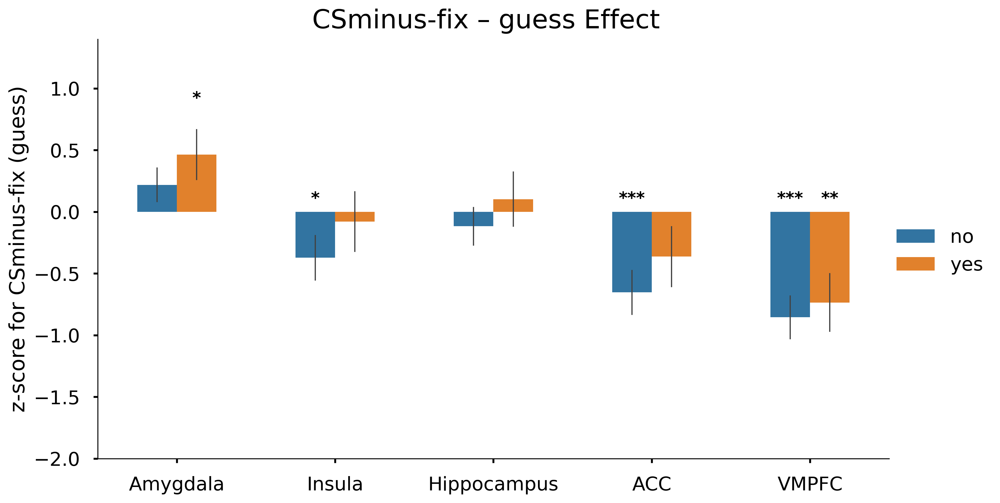

In [10]:
# 1️⃣ Guess main effect
# ---------------------------------------------------------
for contrast in contrast_list:
    print(f"\n===== Group main effect: {contrast} =====")
    df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

    g = sns.catplot(
        x='ROI', y='Z_score', hue='guess',
        order=ROI_list, hue_order=guess_list,
        kind='bar', errorbar='se', 
        height=6, aspect=1.8, width=0.5, 
        err_kws={'linewidth': 1},
        data=df
    )

    ax = g.ax
    add_sig_stars(ax, df, ROI_list, get_matching_model_terms(model, "guess")[0], hue_order=guess_list)


    g.set_axis_labels('', f'z-score for {contrast} (guess)')
    g.set(ylim=(-2, 1.4))
    g.legend.set_title('')
    g.figure.suptitle(f'{contrast} – guess Effect', fontsize=22, y=1.02)
    g.figure.set_dpi(300)
    plt.savefig(f'{plot_dir}/{contrast}_guess_sig.png', bbox_inches='tight')
    plt.show()


===== Group main effect: CSR-CSS =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.154     0.66    97    0.512      
Insula          Group[T.HC]                                            -0.029    -0.11    97    0.910      
Hippocampus     Group[T.HC]                                             0.020     0.08    97    0.937      
ACC             Group[T.HC]                                             0.208     0.82    97    0.412      
VMPFC           Group[T.HC]                                            -0.226    -0.83    97    0.410      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

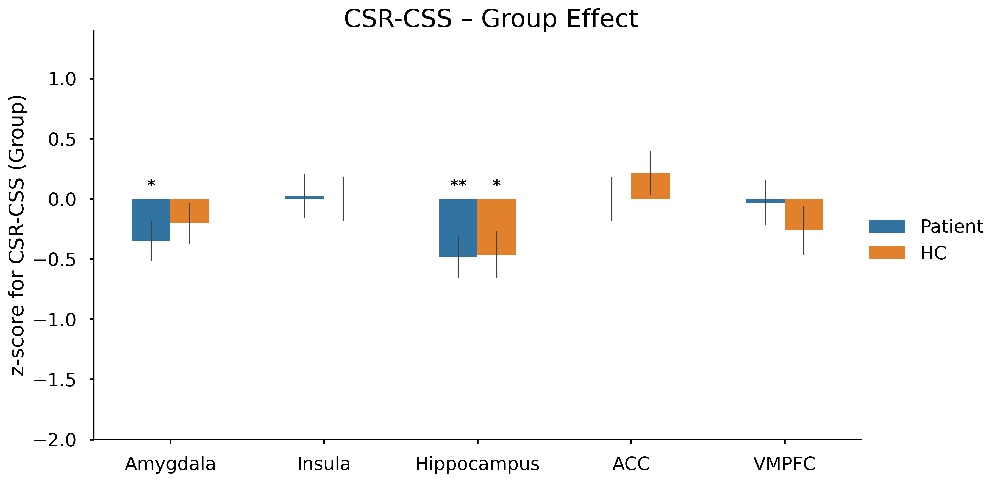


===== Group main effect: CSR-CS- =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.011    -0.05    97    0.962      
Insula          Group[T.HC]                                             0.357     1.25    97    0.215      
Hippocampus     Group[T.HC]                                             0.030     0.10    97    0.920      
ACC             Group[T.HC]                                             0.369     1.30    97    0.196      
VMPFC           Group[T.HC]                                            -0.142    -0.48    97    0.630      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

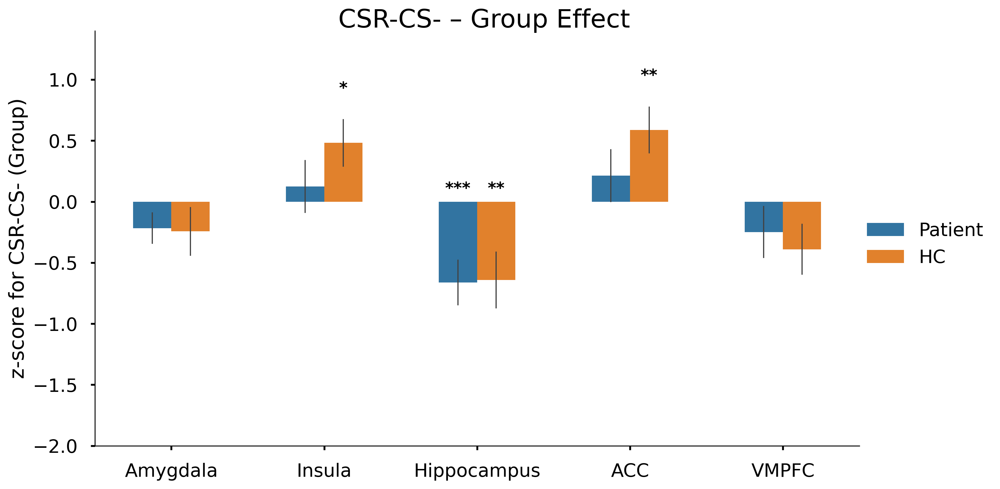


===== Group main effect: CSS-CS- =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.167    -0.76    97    0.450      
Insula          Group[T.HC]                                             0.374     1.31    97    0.194      
Hippocampus     Group[T.HC]                                             0.006     0.03    97    0.979      
ACC             Group[T.HC]                                             0.142     0.52    97    0.602      
VMPFC           Group[T.HC]                                             0.105     0.39    97    0.696      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

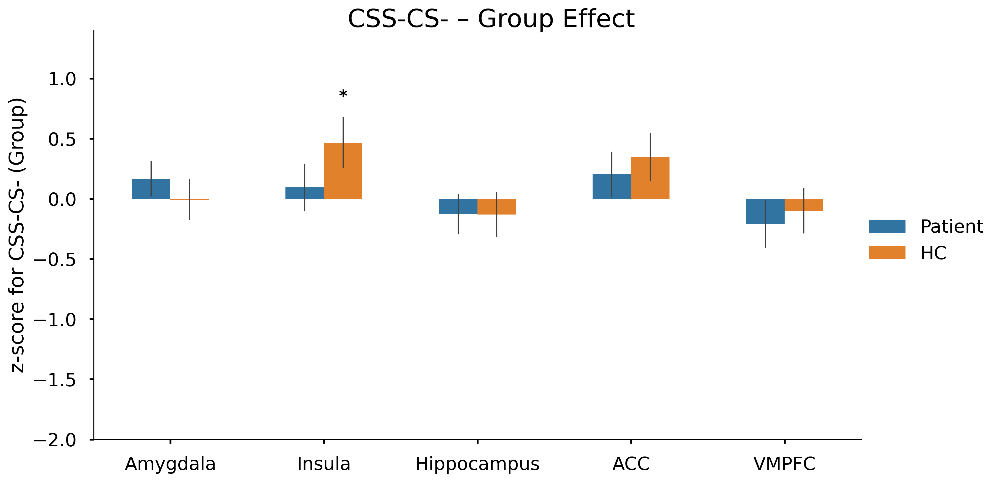


===== Group main effect: CSR-fix =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.014    -0.05    97    0.958      
Insula          Group[T.HC]                                             0.306     1.28    97    0.204      
Hippocampus     Group[T.HC]                                            -0.099    -0.33    97    0.739      
ACC             Group[T.HC]                                             0.383     1.35    97    0.181      
VMPFC           Group[T.HC]                                            -0.106    -0.37    97    0.715      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

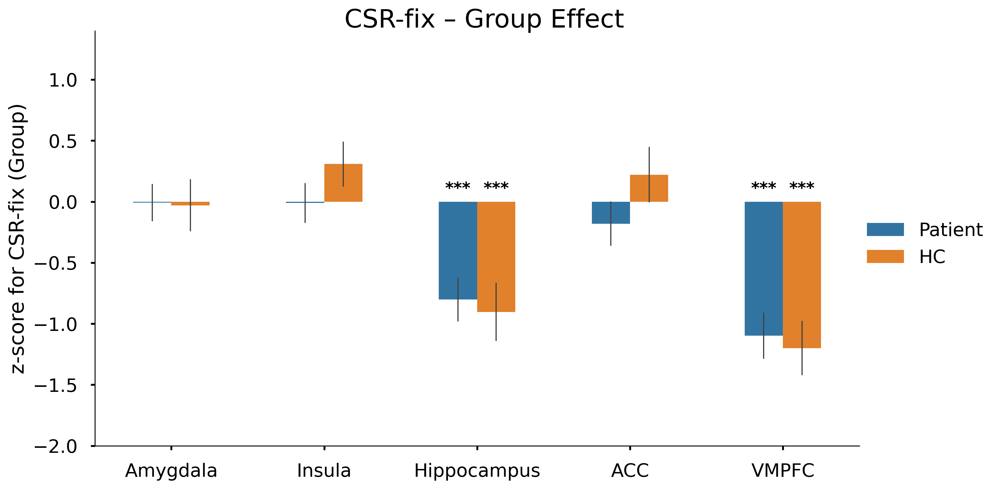


===== Group main effect: CSS-fix =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.209    -0.92    97    0.359      
Insula          Group[T.HC]                                             0.334     1.32    97    0.188      
Hippocampus     Group[T.HC]                                            -0.107    -0.45    97    0.657      
ACC             Group[T.HC]                                             0.088     0.34    97    0.733      
VMPFC           Group[T.HC]                                             0.192     0.67    97    0.504      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

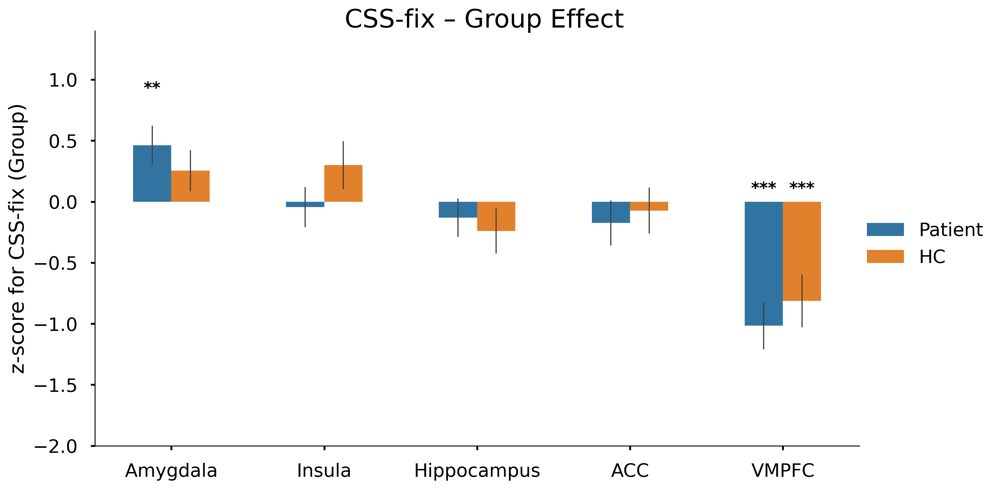


===== Group main effect: CSminus-fix =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.009     0.04    97    0.969      
Insula          Group[T.HC]                                            -0.164    -0.57    97    0.573      
Hippocampus     Group[T.HC]                                            -0.136    -0.54    97    0.590      
ACC             Group[T.HC]                                            -0.103    -0.36    97    0.722      
VMPFC           Group[T.HC]                                             0.071     0.25    97    0.799      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level          

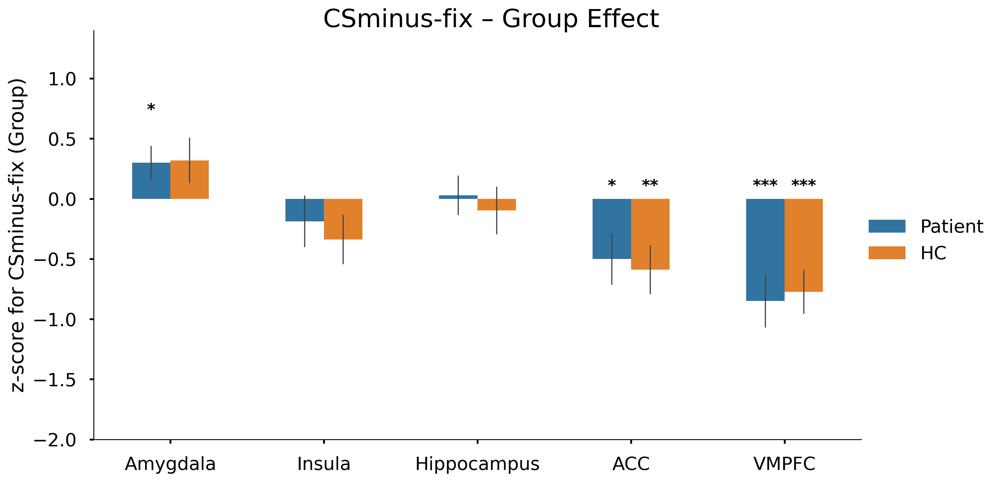

In [11]:
# 1️⃣ Group main effect
# ---------------------------------------------------------
for contrast in contrast_list:
    print(f"\n===== Group main effect: {contrast} =====")
    df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

    g = sns.catplot(
        x='ROI', y='Z_score', hue='Group',
        order=ROI_list, hue_order=group_list,
        kind='bar', errorbar='se', 
        height=6, aspect=1.8, width=0.5, 
        err_kws={'linewidth': 1},
        data=df
    )

    ax = g.ax
    add_sig_stars(ax, df, ROI_list, get_matching_model_terms(model, "Group")[0], hue_order=group_list)


    g.set_axis_labels('', f'z-score for {contrast} (Group)')
    g.set(ylim=(-2, 1.4))
    g.legend.set_title('')
    g.figure.suptitle(f'{contrast} – Group Effect', fontsize=22, y=1.02)
    g.figure.set_dpi(300)
    plt.savefig(f'{plot_dir}/{contrast}_Group_sig.png', bbox_inches='tight')
    plt.show()


===== Gender main effect: CSR-CSS =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                        -0.058    -0.24    97    0.813      
Insula          Drug[T.Placebo]                                        -0.462    -1.79    97    0.077      
Hippocampus     Drug[T.Placebo]                                         0.254     0.96    97    0.338      
ACC             Drug[T.Placebo]                                        -0.092    -0.35    97    0.727      
VMPFC           Drug[T.Placebo]                                        -0.261    -0.93    97    0.356      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

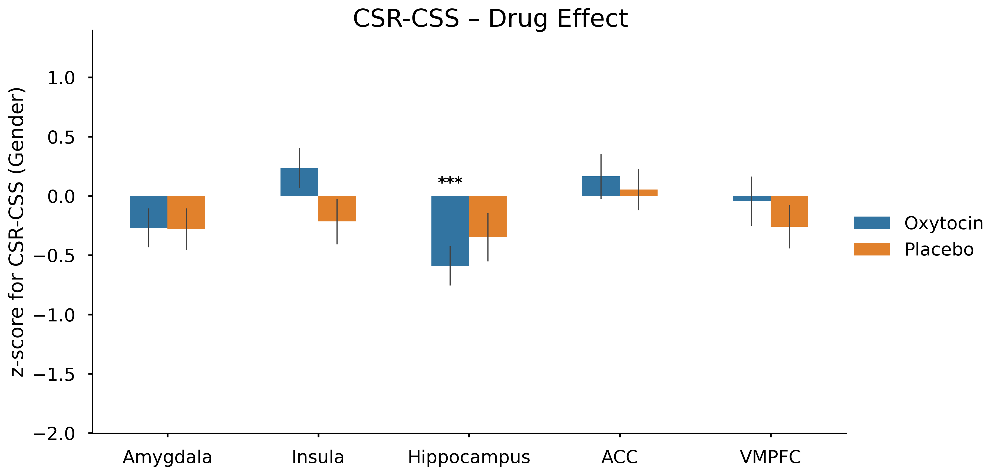


===== Gender main effect: CSR-CS- =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                         0.290     1.22    97    0.226      
Insula          Drug[T.Placebo]                                        -0.358    -1.21    97    0.229      
Hippocampus     Drug[T.Placebo]                                         0.388     1.29    97    0.200      
ACC             Drug[T.Placebo]                                        -0.461    -1.58    97    0.117      
VMPFC           Drug[T.Placebo]                                        -0.166    -0.55    97    0.583      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

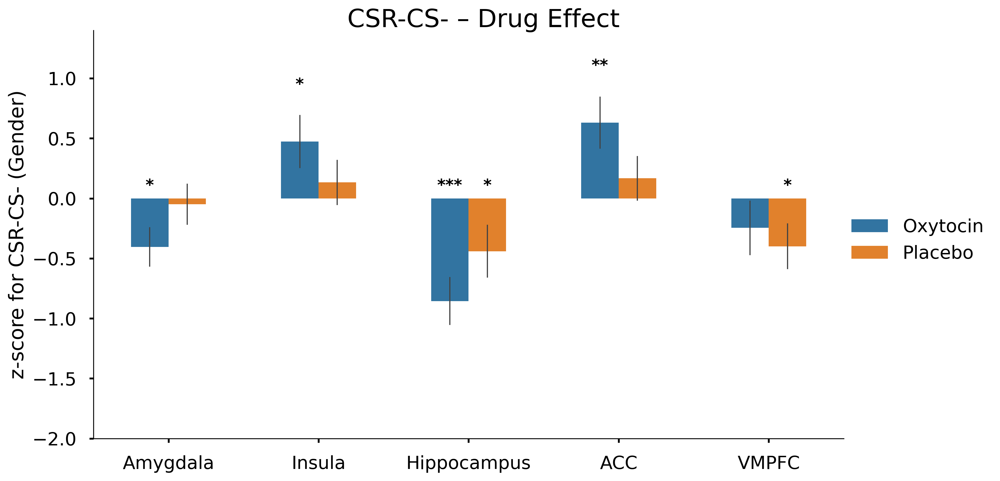


===== Gender main effect: CSS-CS- =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                         0.343     1.52    97    0.131      
Insula          Drug[T.Placebo]                                         0.146     0.49    97    0.624      
Hippocampus     Drug[T.Placebo]                                         0.097     0.38    97    0.704      
ACC             Drug[T.Placebo]                                        -0.351    -1.26    97    0.210      
VMPFC           Drug[T.Placebo]                                         0.095     0.34    97    0.732      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

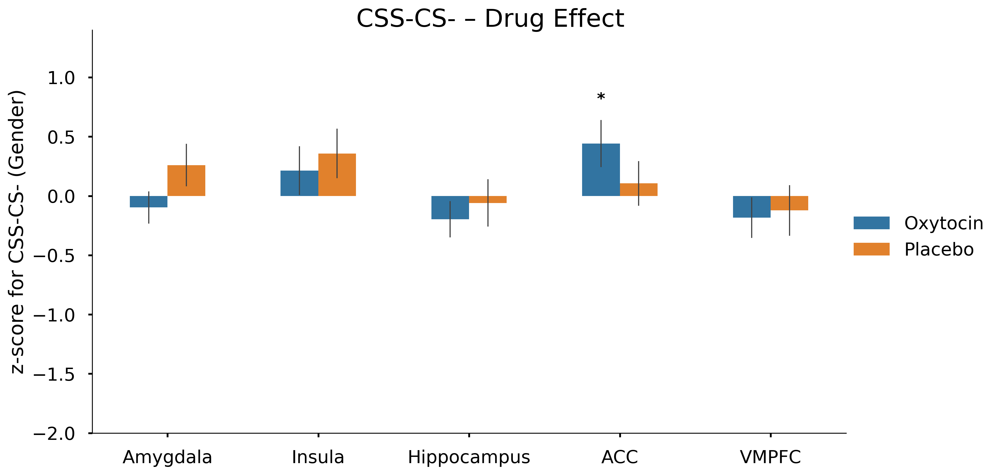


===== Gender main effect: CSR-fix =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                         0.360     1.36    97    0.176      
Insula          Drug[T.Placebo]                                        -0.216    -0.87    97    0.387      
Hippocampus     Drug[T.Placebo]                                         0.390     1.29    97    0.202      
ACC             Drug[T.Placebo]                                         0.145     0.49    97    0.624      
VMPFC           Drug[T.Placebo]                                        -0.021    -0.07    97    0.944      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

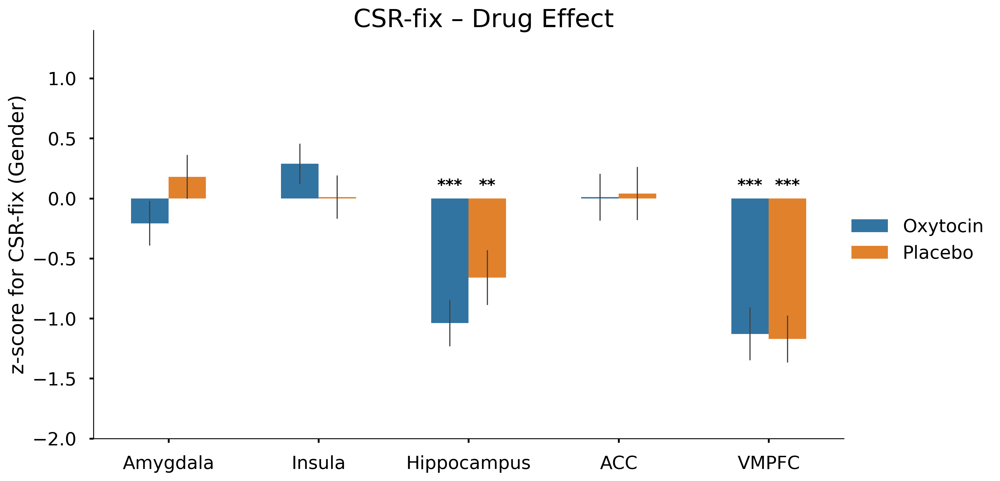


===== Gender main effect: CSS-fix =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                         0.421     1.82    97    0.072      
Insula          Drug[T.Placebo]                                         0.423     1.63    97    0.106      
Hippocampus     Drug[T.Placebo]                                         0.033     0.13    97    0.894      
ACC             Drug[T.Placebo]                                         0.265     1.00    97    0.320      
VMPFC           Drug[T.Placebo]                                         0.316     1.07    97    0.286      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

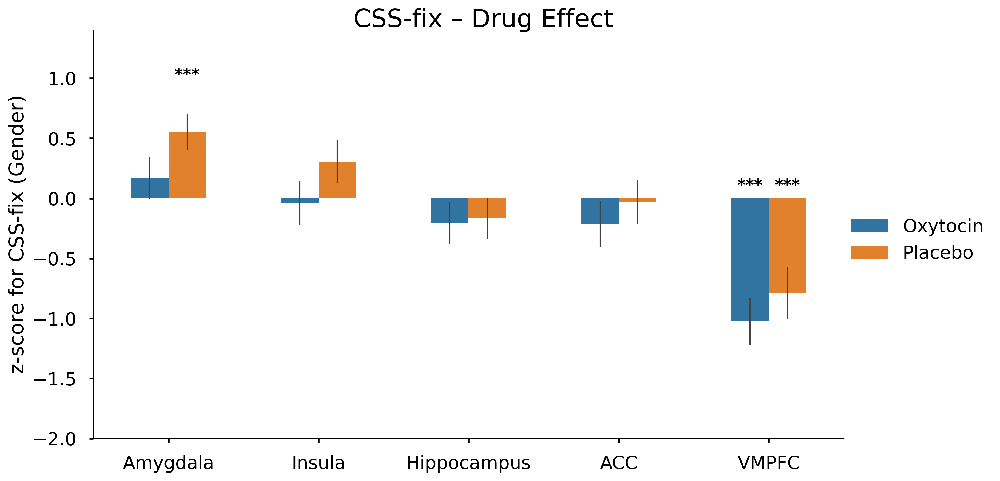


===== Gender main effect: CSminus-fix =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                         0.004     0.02    97    0.987      
Insula          Drug[T.Placebo]                                         0.272     0.91    97    0.366      
Hippocampus     Drug[T.Placebo]                                        -0.109    -0.42    97    0.677      
ACC             Drug[T.Placebo]                                         0.809     2.82    97    0.006    **
VMPFC           Drug[T.Placebo]                                         0.209     0.72    97    0.471      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level           

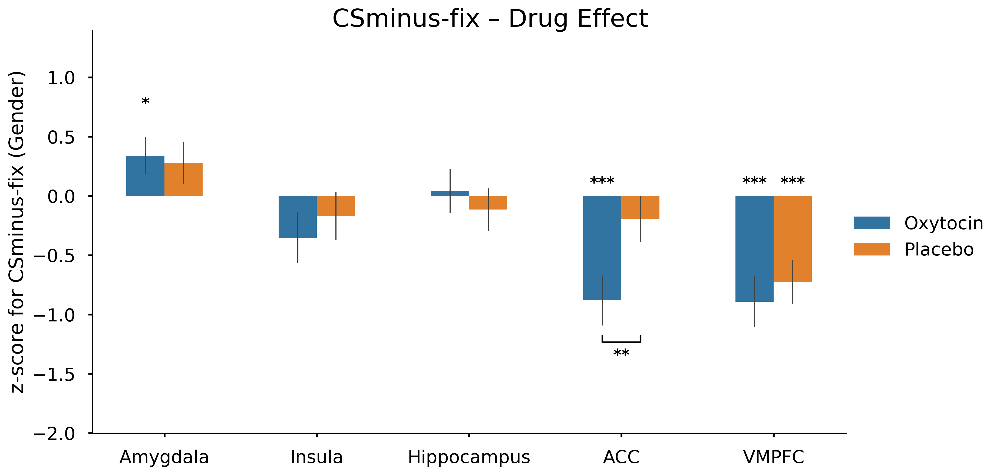

In [12]:
# ---------------------------------------------------------
# 3️⃣ Drug main effect
# ---------------------------------------------------------
for contrast in contrast_list:
    print(f"\n===== Gender main effect: {contrast} =====")
    df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

    g = sns.catplot(
        x='ROI', y='Z_score', hue='Drug',
        order=ROI_list, kind='bar', errorbar='se', height=6, aspect=1.8, width=0.5, 
        err_kws={'linewidth': 1},
        data=df
    )

    ax = g.ax
    add_sig_stars(ax, df, ROI_list, get_matching_model_terms(model, "Drug")[0])

    g.set_axis_labels('', f'z-score for {contrast} (Gender)')
    g.set(ylim=(-2, 1.4))
    g.legend.set_title('')
    g.figure.suptitle(f'{contrast} – Drug Effect', fontsize=22, y=1.02)
    g.figure.set_dpi(300)
    plt.savefig(f'{plot_dir}/{contrast}_Drug_sig.png', bbox_inches='tight')
    plt.show()


===== Gender main effect: CSR-CSS =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                        0.330     1.41    97    0.162      
Insula          Gender[T.Female]                                       -0.356    -1.41    97    0.163      
Hippocampus     Gender[T.Female]                                        0.213     0.83    97    0.409      
ACC             Gender[T.Female]                                       -0.179    -0.71    97    0.482      
VMPFC           Gender[T.Female]                                        0.126     0.46    97    0.648      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

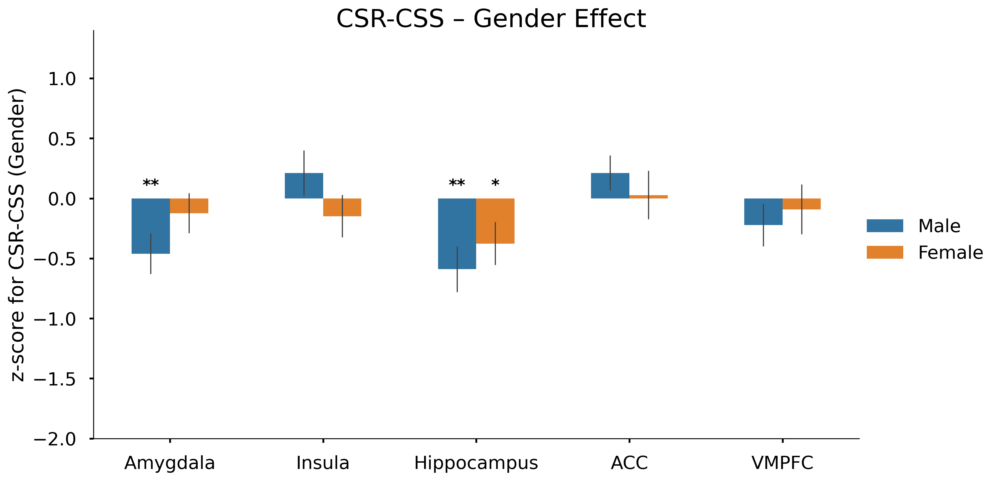


===== Gender main effect: CSR-CS- =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                        0.361     1.56    97    0.121      
Insula          Gender[T.Female]                                        0.015     0.05    97    0.958      
Hippocampus     Gender[T.Female]                                        0.146     0.49    97    0.623      
ACC             Gender[T.Female]                                       -0.231    -0.81    97    0.422      
VMPFC           Gender[T.Female]                                       -0.047    -0.16    97    0.873      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

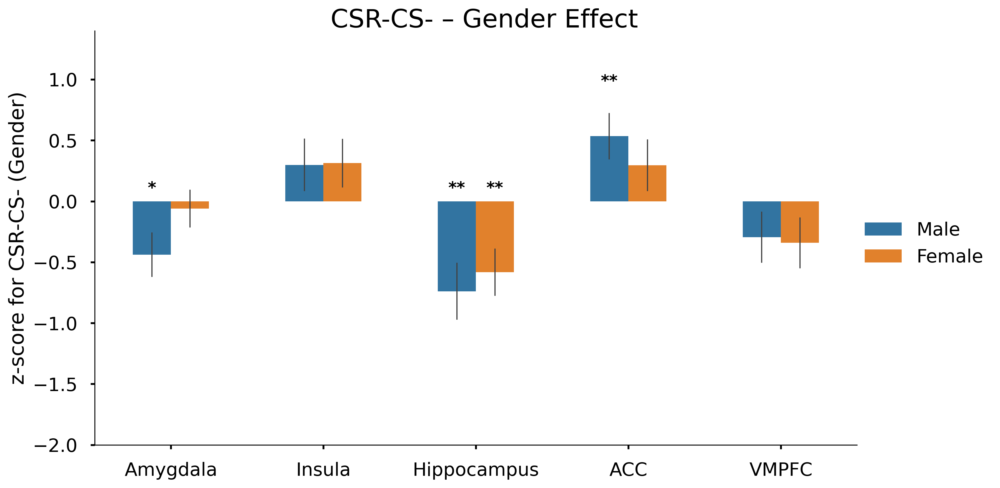


===== Gender main effect: CSS-CS- =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                       -0.016    -0.07    97    0.944      
Insula          Gender[T.Female]                                        0.392     1.37    97    0.175      
Hippocampus     Gender[T.Female]                                       -0.105    -0.43    97    0.671      
ACC             Gender[T.Female]                                       -0.039    -0.14    97    0.885      
VMPFC           Gender[T.Female]                                       -0.191    -0.71    97    0.479      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

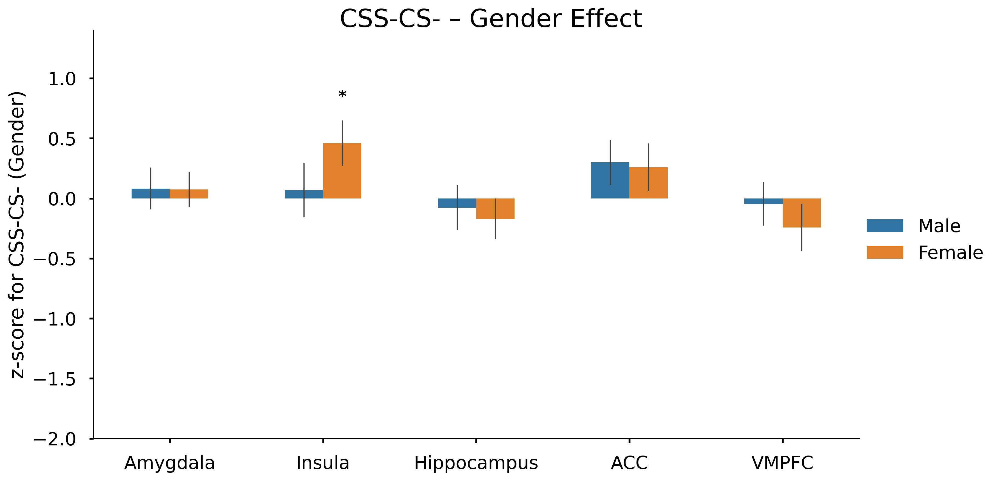


===== Gender main effect: CSR-fix =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                        0.582     2.30    97    0.024     *
Insula          Gender[T.Female]                                       -0.137    -0.57    97    0.572      
Hippocampus     Gender[T.Female]                                        0.492     1.68    97    0.097      
ACC             Gender[T.Female]                                       -0.543    -1.92    97    0.058      
VMPFC           Gender[T.Female]                                        0.137     0.47    97    0.637      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

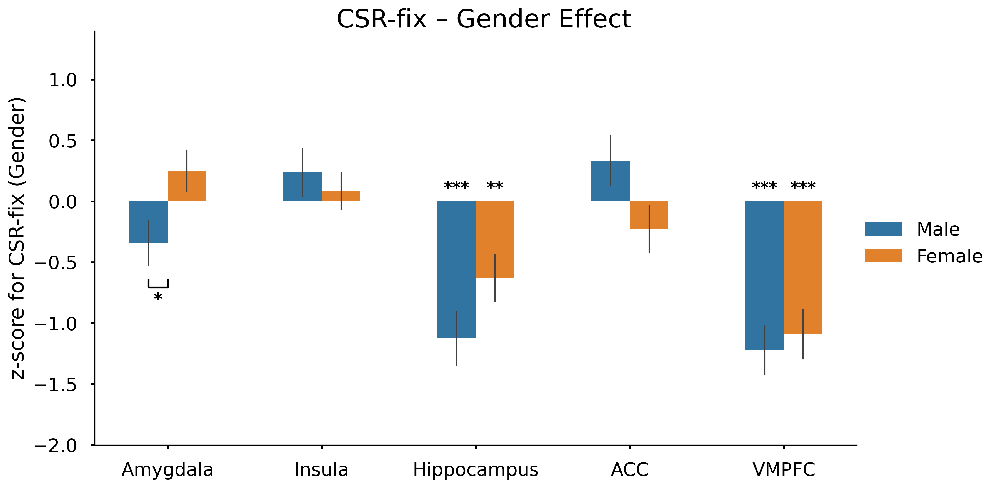


===== Gender main effect: CSS-fix =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                        0.117     0.51    97    0.612      
Insula          Gender[T.Female]                                        0.343     1.35    97    0.179      
Hippocampus     Gender[T.Female]                                        0.184     0.77    97    0.445      
ACC             Gender[T.Female]                                       -0.294    -1.14    97    0.258      
VMPFC           Gender[T.Female]                                       -0.052    -0.18    97    0.858      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

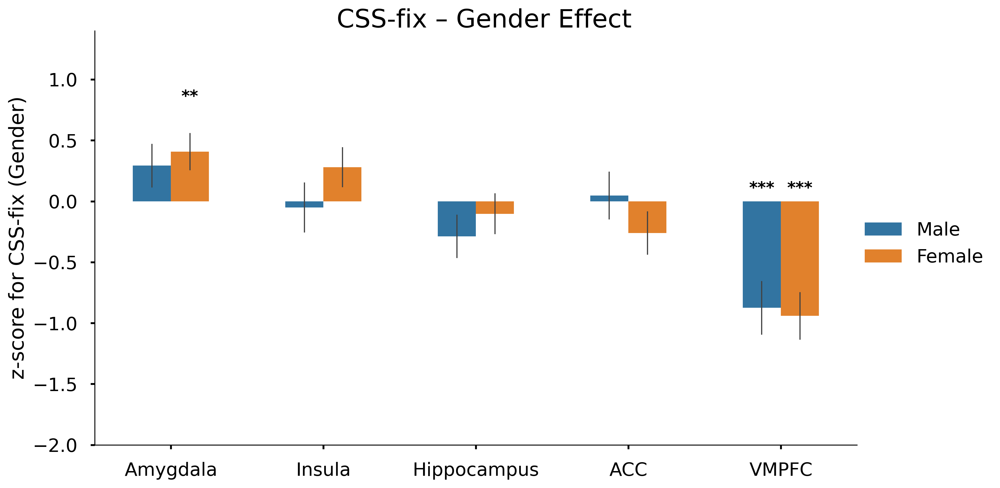


===== Gender main effect: CSminus-fix =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                        0.148     0.64    97    0.521      
Insula          Gender[T.Female]                                       -0.181    -0.62    97    0.536      
Hippocampus     Gender[T.Female]                                        0.349     1.39    97    0.169      
ACC             Gender[T.Female]                                       -0.277    -0.96    97    0.340      
VMPFC           Gender[T.Female]                                        0.226     0.81    97    0.422      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level       

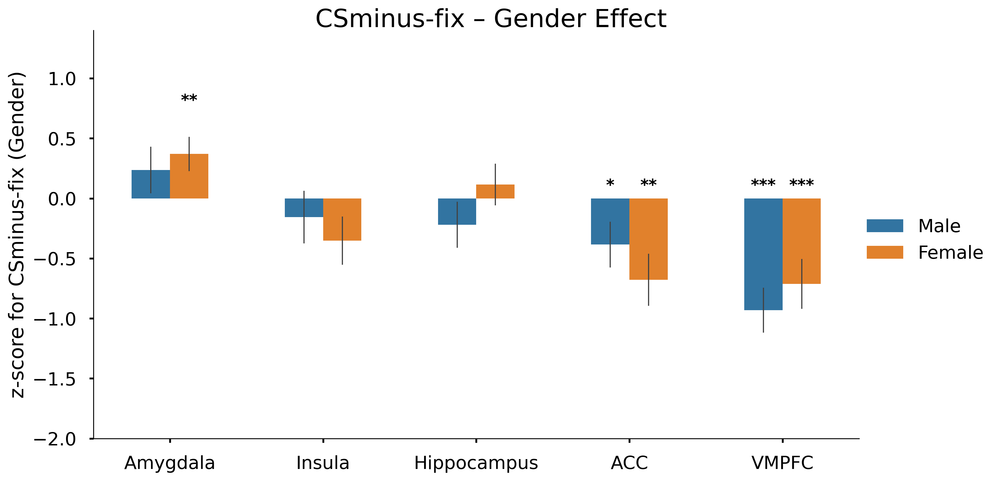

In [13]:
# ---------------------------------------------------------
# 3️⃣ Gender main effect
# ---------------------------------------------------------
for contrast in contrast_list:
    print(f"\n===== Gender main effect: {contrast} =====")
    df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

    g = sns.catplot(
        x='ROI', y='Z_score', hue='Gender',
        order=ROI_list, kind='bar', errorbar='se', height=6, aspect=1.8, width=0.5, 
        err_kws={'linewidth': 1},
        data=df
    )

    ax = g.ax
    add_sig_stars(ax, df, ROI_list, get_matching_model_terms(model, "Gender")[0])

    g.set_axis_labels('', f'z-score for {contrast} (Gender)')
    g.set(ylim=(-2, 1.4))
    g.legend.set_title('')
    g.figure.suptitle(f'{contrast} – Gender Effect', fontsize=22, y=1.02)
    g.figure.set_dpi(300)
    plt.savefig(f'{plot_dir}/{contrast}_Gender_sig.png', bbox_inches='tight')
    plt.show()

In [14]:
get_matching_model_terms(model, "two_way")

['Group[T.HC]:Drug[T.Placebo]', 'Drug[T.Placebo]:Gender[T.Female]']


===== Group × Drug interaction: CSR-CSS =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.335     0.70    95    0.485      
Insula          Group[T.HC]:Drug[T.Placebo]                             0.306     0.60    95    0.550      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                             0.708     1.37    95    0.173      
ACC             Group[T.HC]:Drug[T.Placebo]                             0.031     0.06    95    0.952      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.184     0.33    95    0.741      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


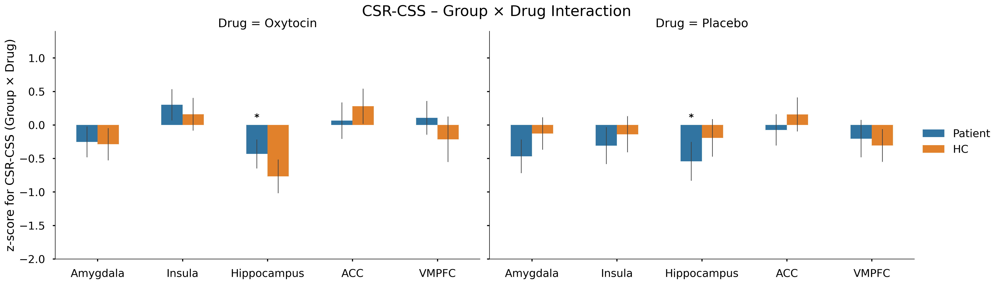


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.4848      
Insula              0.5501      
Hippocampus         0.1734      
ACC                 0.9523      
VMPFC               0.7405      
-----------------------------------


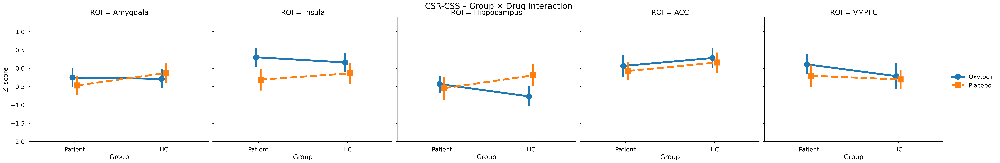


===== Group × Drug interaction: CSR-CS- =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.164     0.35    95    0.728      
Insula          Group[T.HC]:Drug[T.Placebo]                            -0.141    -0.24    95    0.808      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                             0.429     0.72    95    0.471      
ACC             Group[T.HC]:Drug[T.Placebo]                             0.305     0.54    95    0.593      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.272     0.46    95    0.649      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


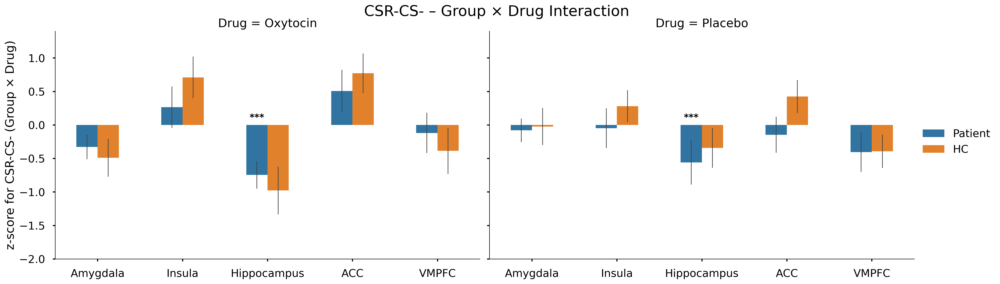


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.7283      
Insula              0.8084      
Hippocampus         0.4714      
ACC                 0.5927      
VMPFC               0.6491      
-----------------------------------


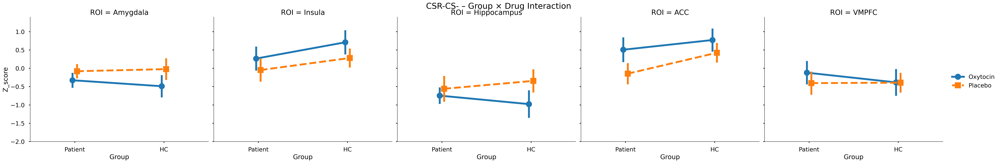


===== Group × Drug interaction: CSS-CS- =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                            -0.209    -0.47    95    0.638      
Insula          Group[T.HC]:Drug[T.Placebo]                            -0.465    -0.80    95    0.425      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                            -0.354    -0.71    95    0.479      
ACC             Group[T.HC]:Drug[T.Placebo]                             0.272     0.50    95    0.620      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.064     0.12    95    0.907      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


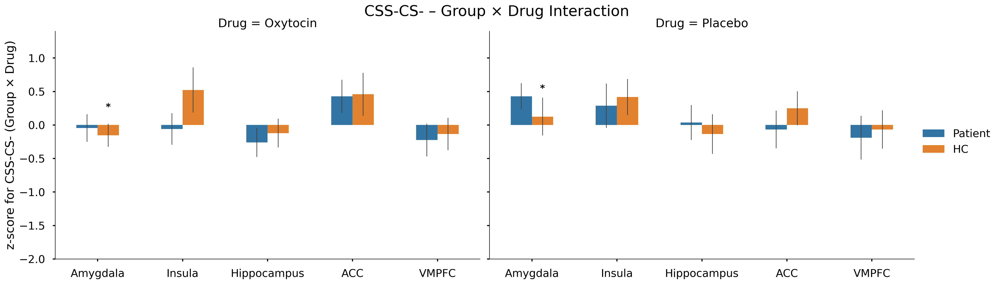


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.6377      
Insula              0.4253      
Hippocampus         0.4790      
ACC                 0.6203      
VMPFC               0.9071      
-----------------------------------


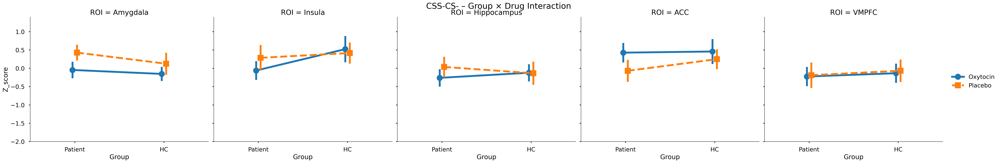


===== Group × Drug interaction: CSR-fix =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.283     0.54    95    0.588      
Insula          Group[T.HC]:Drug[T.Placebo]                             0.046     0.10    95    0.924      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                             0.538     0.90    95    0.368      
ACC             Group[T.HC]:Drug[T.Placebo]                             0.604     1.05    95    0.297      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.850     1.46    95    0.148      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


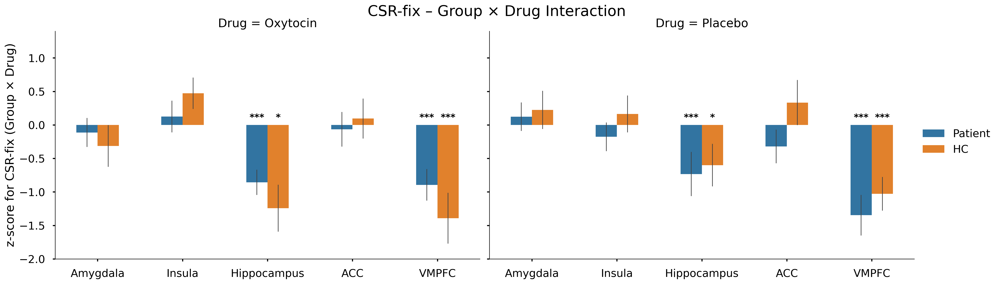


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.5878      
Insula              0.9240      
Hippocampus         0.3685      
ACC                 0.2972      
VMPFC               0.1483      
-----------------------------------


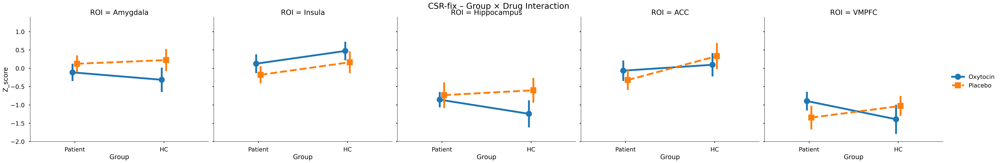


===== Group × Drug interaction: CSS-fix =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                            -0.183    -0.40    95    0.688      
Insula          Group[T.HC]:Drug[T.Placebo]                            -0.349    -0.69    95    0.493      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                            -0.436    -0.90    95    0.372      
ACC             Group[T.HC]:Drug[T.Placebo]                             0.555     1.06    95    0.290      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.575     1.00    95    0.322      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


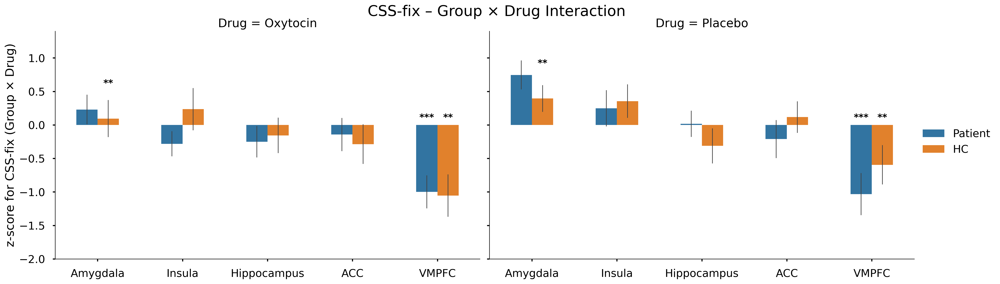


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.6881      
Insula              0.4933      
Hippocampus         0.3719      
ACC                 0.2898      
VMPFC               0.3221      
-----------------------------------


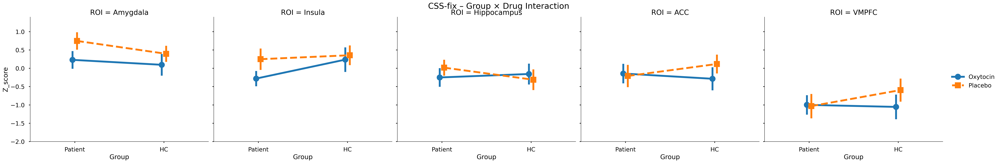


===== Group × Drug interaction: CSminus-fix =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.096     0.21    95    0.838      
Insula          Group[T.HC]:Drug[T.Placebo]                             0.266     0.45    95    0.653      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                             0.003     0.01    95    0.995      
ACC             Group[T.HC]:Drug[T.Placebo]                             0.243     0.43    95    0.668      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.535     0.94    95    0.349      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Dr

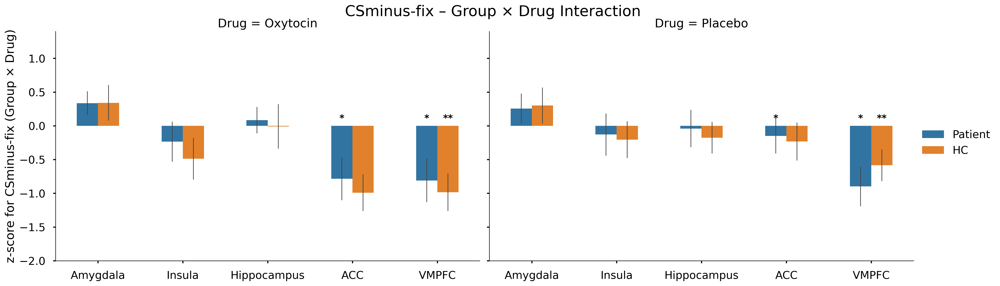


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.8380      
Insula              0.6529      
Hippocampus         0.9947      
ACC                 0.6677      
VMPFC               0.3488      
-----------------------------------


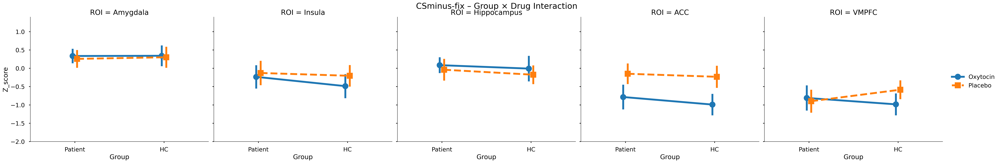


===== Drug × Gender interaction: CSR-CSS =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                       -0.117    -0.24    95    0.808      
Insula          Drug[T.Placebo]:Gender[T.Female]                       -0.236    -0.46    95    0.644      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                       -0.148    -0.28    95    0.778      
ACC             Drug[T.Placebo]:Gender[T.Female]                       -0.401    -0.77    95    0.441      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                       -0.034    -0.06    95    0.951      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

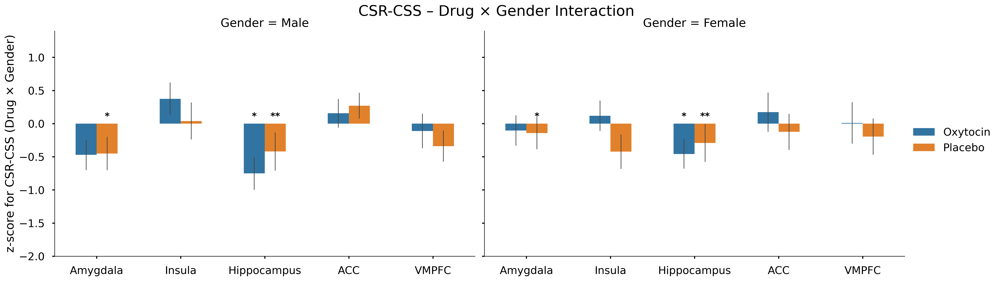


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.8078      
Insula              0.6437      
Hippocampus         0.7777      
ACC                 0.4412      
VMPFC               0.9512      
-----------------------------------


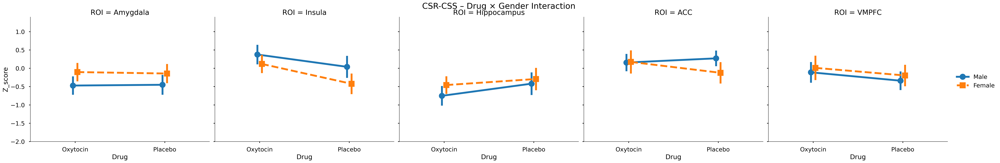


===== Drug × Gender interaction: CSR-CS- =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                       -0.409    -0.88    95    0.383      
Insula          Drug[T.Placebo]:Gender[T.Female]                        0.438     0.75    95    0.458      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                       -0.678    -1.14    95    0.257      
ACC             Drug[T.Placebo]:Gender[T.Female]                       -0.476    -0.83    95    0.411      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                       -1.058    -1.79    95    0.077      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

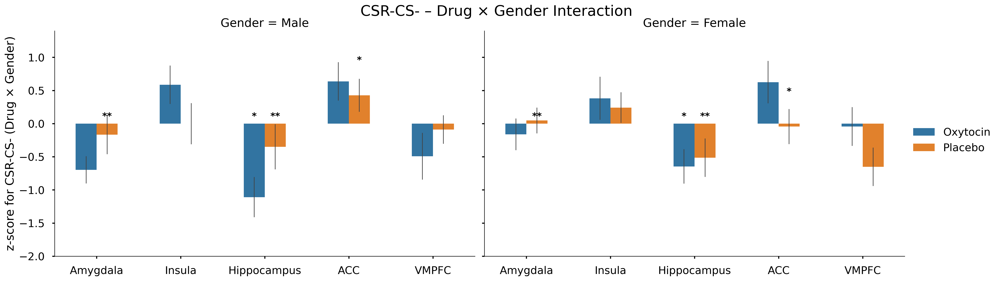


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.3828      
Insula              0.4578      
Hippocampus         0.2575      
ACC                 0.4111      
VMPFC               0.0770      
-----------------------------------


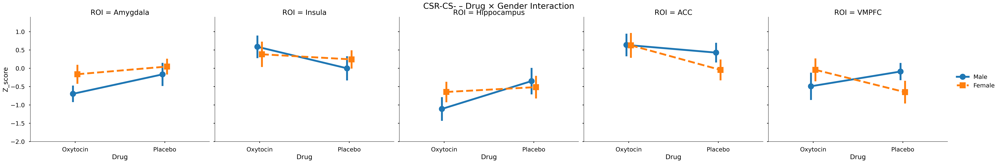


===== Drug × Gender interaction: CSS-CS- =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                       -0.248    -0.55    95    0.581      
Insula          Drug[T.Placebo]:Gender[T.Female]                        0.684     1.17    95    0.243      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                       -0.486    -0.97    95    0.335      
ACC             Drug[T.Placebo]:Gender[T.Female]                       -0.030    -0.05    95    0.957      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                       -0.984    -1.82    95    0.072      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

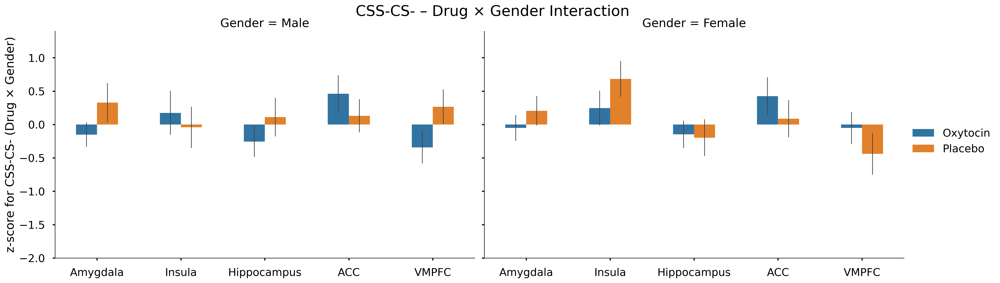


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.5808      
Insula              0.2430      
Hippocampus         0.3349      
ACC                 0.9575      
VMPFC               0.0716      
-----------------------------------


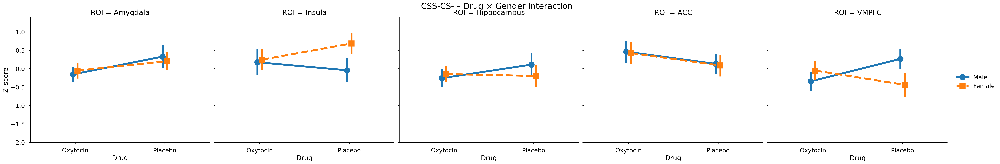


===== Drug × Gender interaction: CSR-fix =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                       -0.106    -0.21    95    0.836      
Insula          Drug[T.Placebo]:Gender[T.Female]                       -0.014    -0.03    95    0.977      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                       -0.277    -0.47    95    0.643      
ACC             Drug[T.Placebo]:Gender[T.Female]                       -0.614    -1.07    95    0.288      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                       -0.641    -1.09    95    0.280      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

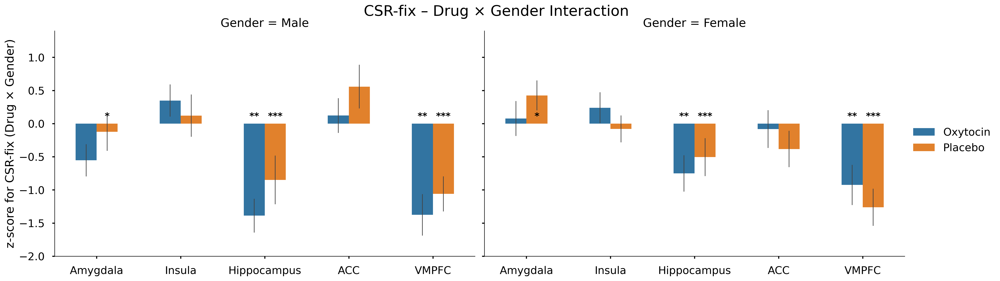


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.8361      
Insula              0.9768      
Hippocampus         0.6428      
ACC                 0.2880      
VMPFC               0.2803      
-----------------------------------


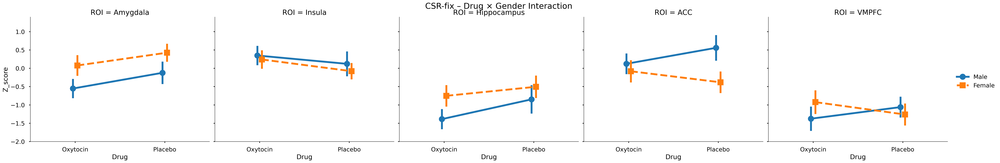


===== Drug × Gender interaction: CSS-fix =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                        0.055     0.12    95    0.905      
Insula          Drug[T.Placebo]:Gender[T.Female]                        0.310     0.61    95    0.546      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                       -0.060    -0.12    95    0.904      
ACC             Drug[T.Placebo]:Gender[T.Female]                       -0.059    -0.11    95    0.910      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                       -0.570    -0.98    95    0.331      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

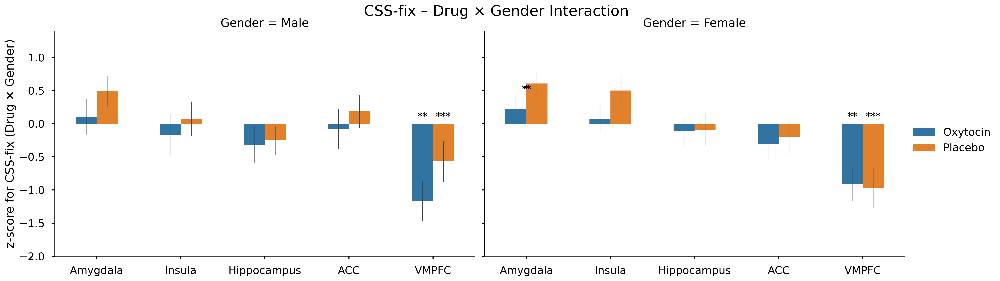


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.9051      
Insula              0.5456      
Hippocampus         0.9037      
ACC                 0.9102      
VMPFC               0.3309      
-----------------------------------


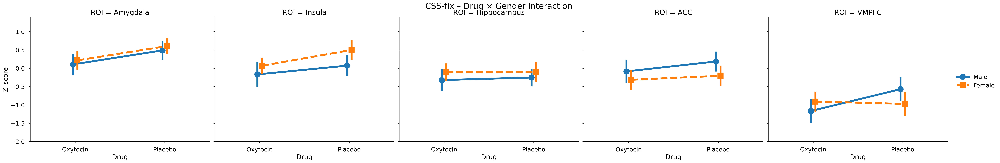


===== Drug × Gender interaction: CSminus-fix =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                        0.436     0.93    95    0.354      
Insula          Drug[T.Placebo]:Gender[T.Female]                       -0.632    -1.07    95    0.288      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                        0.624     1.22    95    0.225      
ACC             Drug[T.Placebo]:Gender[T.Female]                        0.002     0.00    95    0.997      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                        0.761     1.34    95    0.184      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × G

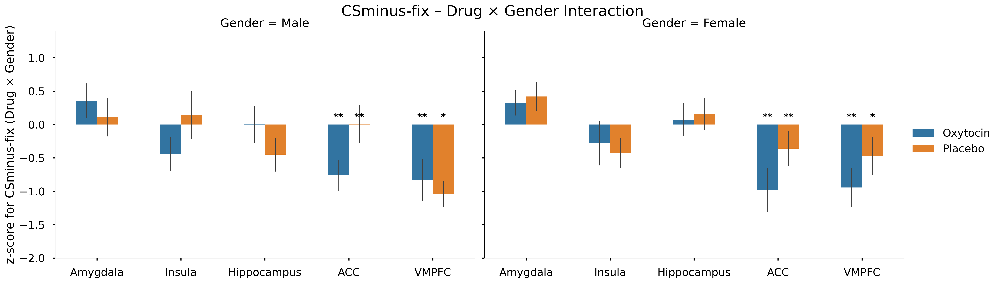


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.3538      
Insula              0.2876      
Hippocampus         0.2250      
ACC                 0.9968      
VMPFC               0.1837      
-----------------------------------


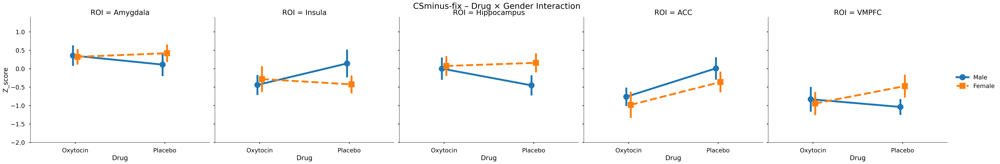

In [15]:
interaction_terms = get_matching_model_terms(model, "two_way")

for term in interaction_terms:
    var1, var2 = extract_factors_from_term(term)
    for contrast in contrast_list:
        print(f"\n===== {var1} × {var2} interaction: {contrast} =====")
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

        g = sns.catplot(
            x='ROI', y='Z_score', hue=var1, col=var2,
            order=ROI_list,
            kind='bar', errorbar='se',
            height=6, aspect=1.6, width=0.5,
            err_kws={'linewidth': 1},
            data=df
        )

        for ax in g.axes.flat:
            add_sig_stars(ax, df, ROI_list, term)

        g.set_axis_labels('', f'z-score for {contrast} ({var1} × {var2})')
        g.set(ylim=(-2, 1.4))
        g.legend.set_title('')
        g.figure.suptitle(f'{contrast} – {var1} × {var2} Interaction', fontsize=22, y=1.02)
        g.figure.set_dpi(300)
        plt.savefig(f'{plot_dir}/{contrast}_{var1}_{var2}_interaction_sig.png', bbox_inches='tight')
        plt.show()

        #line plots
        g = sns.catplot(
            data=df,
            x=var1, y='Z_score', hue=var2,
            col='ROI',
            kind='point',         # line plot (mean + SE)
            errorbar='se',        # ✅ correct for seaborn ≥0.12
            dodge=True,
            markers=['o', 's'],
            linestyles=['-', '--'],
            height=6, aspect=1.2
        )
        add_sig_stars_lineplot_interaction(
            g.axes, df, ROI_list, term
        )
        #g.set_axis_labels('', f'z-score for {contrast} ({var1} × {var2})')
        g.set(ylim=(-2, 1.4))
        g.legend.set_title('')
        g.figure.suptitle(f'{contrast} – {var1} × {var2} Interaction', fontsize=22, y=1.02)
        g.figure.set_dpi(300)
        plt.savefig(f'{plot_dir}/line_{contrast}_{var1}_{var2}_interaction_sig.png', bbox_inches='tight')
        plt.show()

In [16]:
interaction_terms = get_matching_model_terms(model, "three_way")

for term in interaction_terms:
    var1, var2, var3 = extract_factors_from_term(term)
    for contrast in contrast_list:
        print(f"\n===== {var1} × {var2}  × {var3} interaction: {contrast} =====")
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

        g = sns.catplot(
            x='ROI', y='Z_score', hue=var1, col=var2, row=var3,
            order=ROI_list,
            kind='bar', errorbar='se',
            height=6, aspect=1.6, width=0.5,
            err_kws={'linewidth': 1},
            data=df
        )

        for ax in g.axes.flat:
            add_sig_stars(ax, df, ROI_list, term)

        g.set_axis_labels('', f'z-score for {contrast} ({var1} × {var2} × {var3})')
        g.set(ylim=(-2, 1.4))
        g.legend.set_title('')
        g.figure.suptitle(f'{contrast} – {var1} × {var2}  × {var3} Interaction', fontsize=22, y=1.02)
        g.figure.set_dpi(300)
        plt.savefig(f'{plot_dir}/{contrast}_{var1}_{var2}_{var3}_interaction_sig.png', bbox_inches='tight')
        plt.show()

        #line plots
        g = sns.catplot(
            data=df,
            x=var1, y='Z_score', hue=var2, row=var3,
            col='ROI',
            kind='point',         # line plot (mean + SE)
            errorbar='se',        # ✅ correct for seaborn ≥0.12
            dodge=True,
            markers=['o', 's'],
            linestyles=['-', '--'],
            height=6, aspect=1.2
        )
        add_sig_stars_lineplot_interaction(
            g.axes, df, ROI_list, term
        )
        #g.set_axis_labels('', f'z-score for {contrast} ({var1} × {var2})')
        g.set(ylim=(-2, 1.4))
        g.legend.set_title('')
        g.figure.suptitle(f'{contrast} – {var1} × {var2} × {var3} Interaction', fontsize=22, y=1.02)
        g.figure.set_dpi(300)
        plt.savefig(f'{plot_dir}/line_{contrast}_{var1}_{var2}_{var3}_interaction_sig.png', bbox_inches='tight')
        plt.show()

In [17]:

formula = "Z_score ~ Group + Drug + Gender + guess + Group * Drug + Drug * Gender"

for contrast in contrast_list:
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

        print(f"\nModel results ({formula}) in {contrast}")
        print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
        print("-" * 100)

        # === Table 1: Model results ===
        for i, roi in enumerate(ROI_list):
            df_roi = df[df["ROI"] == roi]
            if len(df_roi) < 4:
                continue
            model = smf.ols(formula, data=df_roi).fit()
            dfree = int(model.df_resid)

            # Extract and print all terms except intercept
            for term in model.params.index:
                if term.lower() == "intercept":
                    continue

                beta = model.params[term]
                tval = model.tvalues[term]
                pval = model.pvalues[term]
                star = significance_marker(pval)

                print(f"{roi:<15} {term:<50} {beta:>10.3f} {tval:>8.2f} "
                    f"{dfree:>5} {pval:>10.4f} {star:>5}")

        print("-" * 100)
    


Model results (Z_score ~ Group + Drug + Gender + guess + Group * Drug + Drug * Gender) in CSR-CSS
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.030     0.09    93     0.9279      
Amygdala        Drug[T.Placebo]                                        -0.184    -0.42    93     0.6780      
Amygdala        Gender[T.Female]                                        0.387     1.16    93     0.2499      
Amygdala        guess[T.yes]                                           -0.168    -0.65    93     0.5196      
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.323     0.67    93     0.5029      
Amygdala        Drug[T.Placebo]:Gender[T.Female]                       -0.091    -0.19    93     0.8514      
Insula          Group[T.HC]     

In [18]:

formula = "Z_score ~ Group * Drug + guess"

for contrast in contrast_list:
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

        print(f"\nModel results ({formula}) in {contrast}")
        print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
        print("-" * 100)

        # === Table 1: Model results ===
        for i, roi in enumerate(ROI_list):
            df_roi = df[df["ROI"] == roi]
            if len(df_roi) < 4:
                continue
            model = smf.ols(formula, data=df_roi).fit()
            dfree = int(model.df_resid)

            # Extract and print all terms except intercept
            for term in model.params.index:
                if term.lower() == "intercept":
                    continue

                beta = model.params[term]
                tval = model.tvalues[term]
                pval = model.pvalues[term]
                star = significance_marker(pval)

                print(f"{roi:<15} {term:<50} {beta:>10.3f} {tval:>8.2f} "
                    f"{dfree:>5} {pval:>10.4f} {star:>5}")

        print("-" * 100)
    


Model results (Z_score ~ Group * Drug + guess) in CSR-CSS
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.004    -0.01    95     0.9913      
Amygdala        Drug[T.Placebo]                                        -0.239    -0.70    95     0.4841      
Amygdala        guess[T.yes]                                           -0.178    -0.70    95     0.4875      
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.335     0.70    95     0.4848      
Insula          Group[T.HC]                                            -0.137    -0.38    95     0.7027      
Insula          Drug[T.Placebo]                                        -0.615    -1.69    95     0.0943      
Insula          guess[T.yes]                                           -

In [19]:

formula = "Z_score ~ Group + Gender + guess"
for contrast in contrast_list:
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

        print(f"\nModel results ({formula}) in {contrast}")
        print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
        print("-" * 100)

        # === Table 1: Model results ===
        for i, roi in enumerate(ROI_list):
            df_roi = df[df["ROI"] == roi]
            if len(df_roi) < 4:
                continue
            model = smf.ols(formula, data=df_roi).fit()
            dfree = int(model.df_resid)

            # Extract and print all terms except intercept
            for term in model.params.index:
                if term.lower() == "intercept":
                    continue

                beta = model.params[term]
                tval = model.tvalues[term]
                pval = model.pvalues[term]
                star = significance_marker(pval)

                print(f"{roi:<15} {term:<50} {beta:>10.3f} {tval:>8.2f} "
                    f"{dfree:>5} {pval:>10.4f} {star:>5}")

        print("-" * 100)
    


Model results (Z_score ~ Group + Gender + guess) in CSR-CSS
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.182     0.78    96     0.4391      
Amygdala        Gender[T.Female]                                        0.344     1.46    96     0.1464      
Amygdala        guess[T.yes]                                           -0.161    -0.67    96     0.5064      
Insula          Group[T.HC]                                            -0.058    -0.23    96     0.8208      
Insula          Gender[T.Female]                                       -0.361    -1.41    96     0.1606      
Insula          guess[T.yes]                                            0.052     0.20    96     0.8422      
Hippocampus     Group[T.HC]                                           

In [20]:

formula = "Z_score ~ Drug * Gender + guess"

for contrast in contrast_list:
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

        print(f"\nModel results ({formula}) in {contrast}")
        print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
        print("-" * 100)

        # === Table 1: Model results ===
        for i, roi in enumerate(ROI_list):
            df_roi = df[df["ROI"] == roi]
            if len(df_roi) < 4:
                continue
            model = smf.ols(formula, data=df_roi).fit()
            dfree = int(model.df_resid)

            # Extract and print all terms except intercept
            for term in model.params.index:
                if term.lower() == "intercept":
                    continue

                beta = model.params[term]
                tval = model.tvalues[term]
                pval = model.pvalues[term]
                star = significance_marker(pval)

                print(f"{roi:<15} {term:<50} {beta:>10.3f} {tval:>8.2f} "
                    f"{dfree:>5} {pval:>10.4f} {star:>5}")

        print("-" * 100)
    


Model results (Z_score ~ Drug * Gender + guess) in CSR-CSS
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                         0.008     0.02    95     0.9809      
Amygdala        Gender[T.Female]                                        0.386     1.16    95     0.2472      
Amygdala        guess[T.yes]                                           -0.178    -0.70    95     0.4879      
Amygdala        Drug[T.Placebo]:Gender[T.Female]                       -0.117    -0.24    95     0.8078      
Insula          Drug[T.Placebo]                                        -0.342    -0.92    95     0.3610      
Insula          Gender[T.Female]                                       -0.247    -0.70    95     0.4841      
Insula          guess[T.yes]                                           